In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle

In [3]:
!kaggle datasets download kritikseth/fruit-and-vegetable-image-recognition

Dataset URL: https://www.kaggle.com/datasets/kritikseth/fruit-and-vegetable-image-recognition
License(s): CC0-1.0


In [4]:
import zipfile

zip_ref = zipfile.ZipFile("/content/fruit-and-vegetable-image-recognition.zip")
zip_ref.extractall("/content")
zip_ref.close()

In [5]:
# !pip install tensorflow

In [6]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import *
from tensorflow.keras import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16, MobileNetV2
import random

###Image Data Generation method

In [7]:
train_datagen = ImageDataGenerator(rescale = 1./255, horizontal_flip= True, vertical_flip= True, rotation_range= 0.2,
                                   width_shift_range = 0.2, height_shift_range = 0.2, zoom_range = 0.1)

test_datagen = ImageDataGenerator(rescale = 1./255, rotation_range= 0.2, horizontal_flip= True, vertical_flip= True, zoom_range = 0.1,
                                  height_shift_range = 0.2, width_shift_range = 0.2)

validation_datagen = ImageDataGenerator(rescale = 1./255, rotation_range= 0.2, horizontal_flip= True, vertical_flip= True, zoom_range = 0.1,
                                  height_shift_range = 0.2, width_shift_range = 0.2)

### train and test dataset from Image data generation step

In [8]:
train_df = train_datagen.flow_from_directory("/content/train", target_size = (150, 150), color_mode = 'rgb', class_mode = 'categorical', batch_size = 64)
test_df = test_datagen.flow_from_directory("/content/test", target_size = (150, 150), color_mode = 'rgb', class_mode = 'categorical', batch_size = 64)
validation_df = validation_datagen.flow_from_directory("/content/validation", target_size = (150, 150), color_mode = 'rgb', class_mode = 'categorical', batch_size = 64)

Found 3115 images belonging to 36 classes.
Found 359 images belonging to 36 classes.
Found 351 images belonging to 36 classes.


## Visualization

In [9]:
def process_image(path, num_images):
  # Get a list of image filenames
  image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

  if not image_filenames:
    raise ValueError(f"No Image file found in {path}")

  # Select random images
  selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

  # Create a figure and axes
  fig, axes = plt.subplots(1, num_images, figsize=(15, 2), facecolor='white')

  # Display each image
  for i, image_filename in enumerate(selected_images):
      # Load image
      image_path = os.path.join(path, image_filename)
      image = plt.imread(image_path)

      # Display image
      axes[i].imshow(image)
      axes[i].axis('off')
      axes[i].set_title(image_filename)  # Set image filename as title

  # Adjust layout and display
  plt.tight_layout()
  plt.show()

In [10]:
fruit_list = ["banana", "apple", "pear", "grapes", "orange", "kiwi", "watermelon", "pomegranate", "pineapple", "mango"]
veg_list = ["cucumber", "carrot", "capsicum", "onion", "potato", "lemon", "tomato", "raddish", "beetroot", "cabbage",
            "lettuce", "spinach", "soy beans", "cauliflower", "bell pepper", "chilli pepper", "turnip", "corn", "sweetcorn", "sweetpotato",
            "paprika", "jalepeno", "ginger", "garlic", "peas", "eggplant"]

print(f"Total categorical values in the dataset is {len(fruit_list) + len(veg_list)}")

Total categorical values in the dataset is 36


## Fruits Images in Training set

**************** BANANA ****************



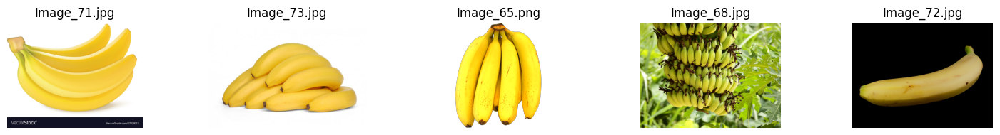

None

**************** APPLE ****************



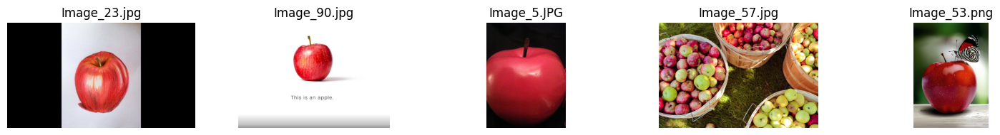

None

**************** PEAR ****************



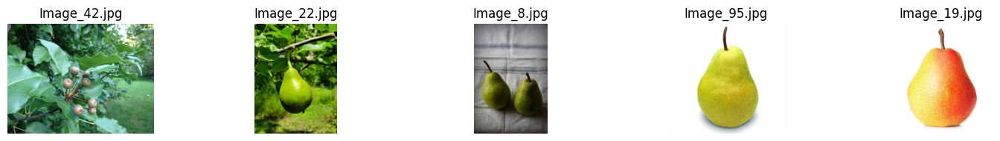

None

**************** GRAPES ****************



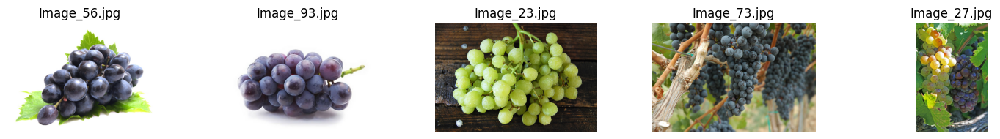

None

**************** ORANGE ****************



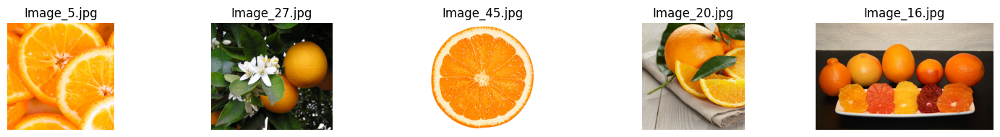

None

**************** KIWI ****************



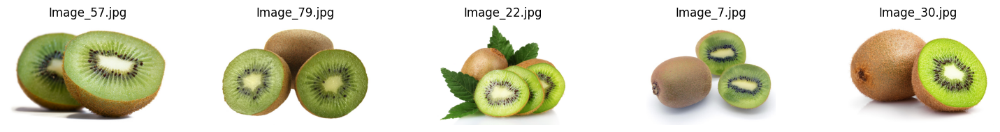

None

**************** WATERMELON ****************



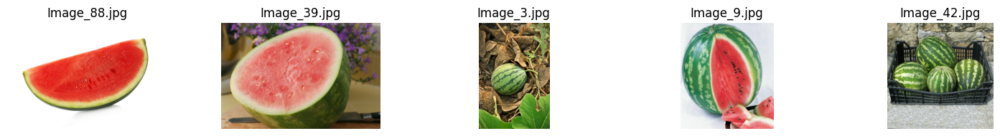

None

**************** POMEGRANATE ****************



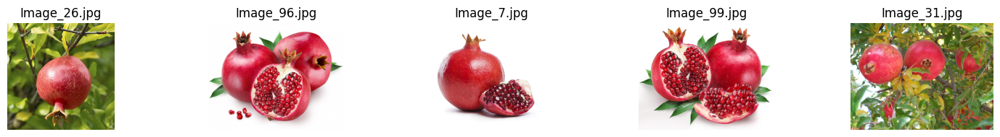

None

**************** PINEAPPLE ****************



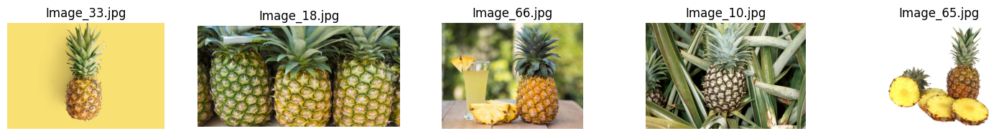

None

**************** MANGO ****************



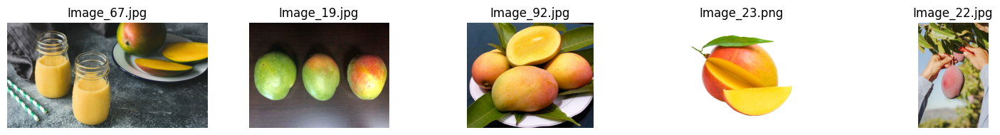

None



In [11]:

for i in fruit_list:
  print("****************", i.upper(), "****************")
  print()
  print(process_image("/content/train/" + i, num_images = 5))
  print()

## Vegetables Images in training set

**************** CUCUMBER ****************



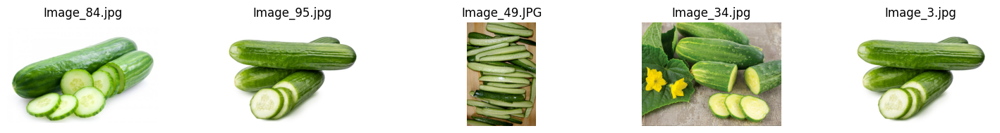

None

**************** CARROT ****************



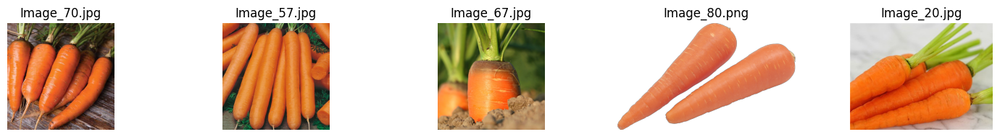

None

**************** CAPSICUM ****************



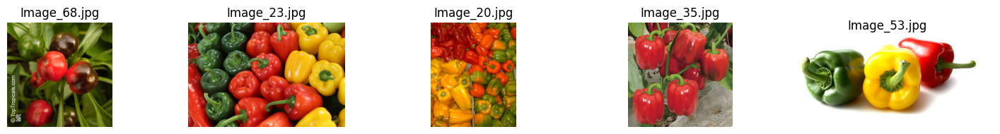

None

**************** ONION ****************



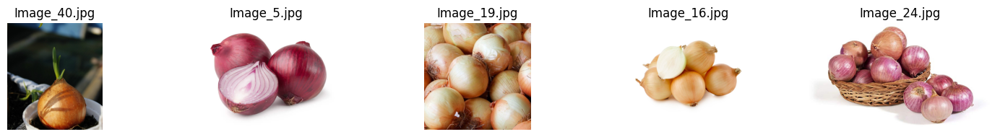

None

**************** POTATO ****************



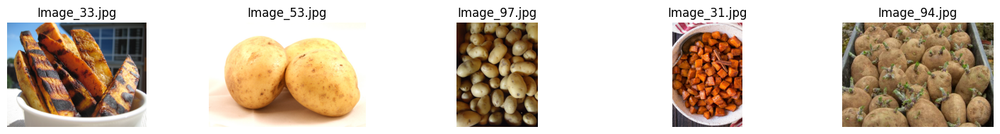

None

**************** LEMON ****************



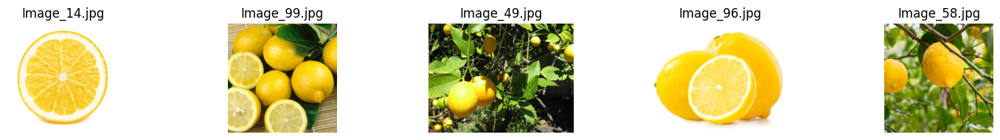

None

**************** TOMATO ****************



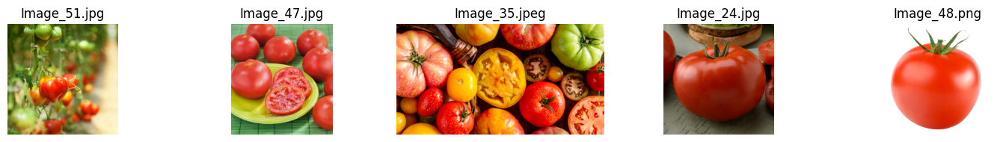

None

**************** RADDISH ****************



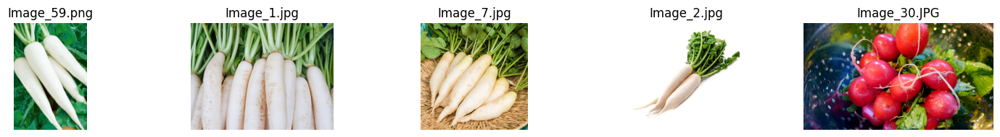

None

**************** BEETROOT ****************



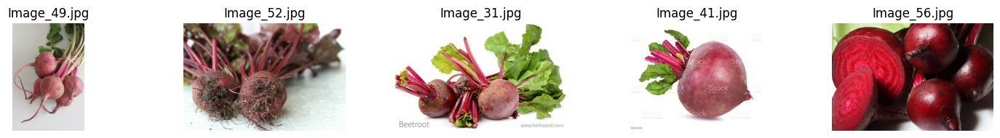

None

**************** CABBAGE ****************



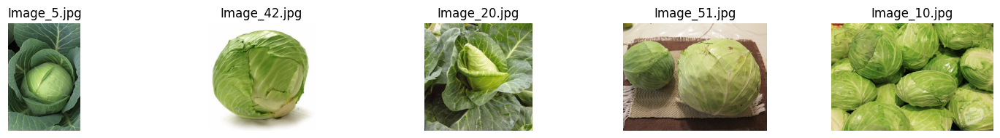

None

**************** LETTUCE ****************



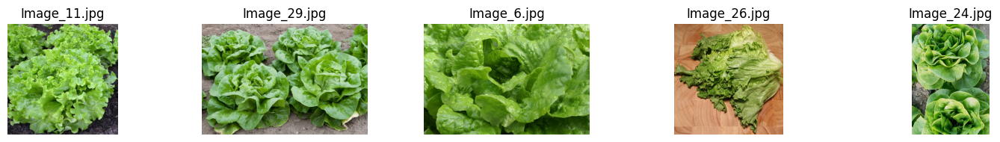

None

**************** SPINACH ****************



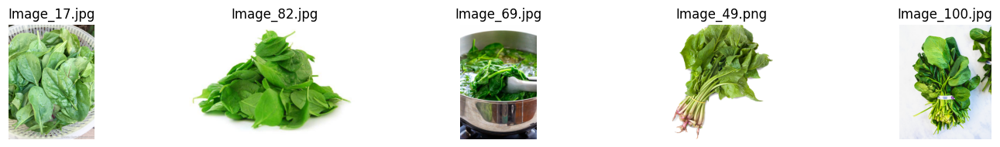

None

**************** SOY BEANS ****************



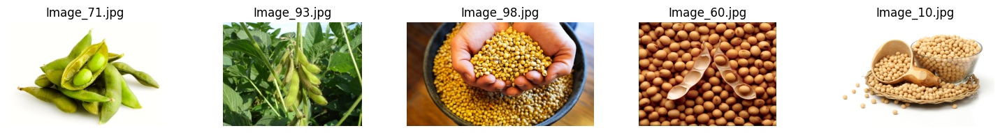

None

**************** CAULIFLOWER ****************



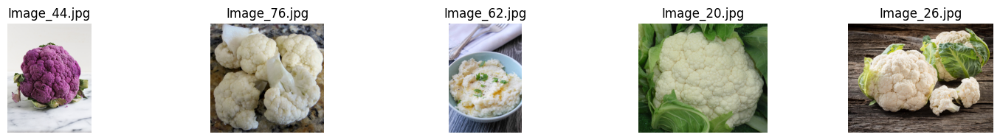

None

**************** BELL PEPPER ****************



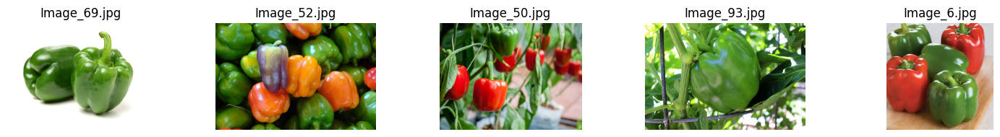

None

**************** CHILLI PEPPER ****************



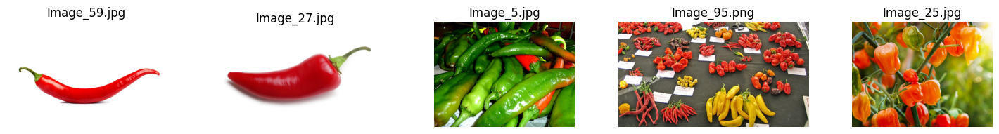

None

**************** TURNIP ****************



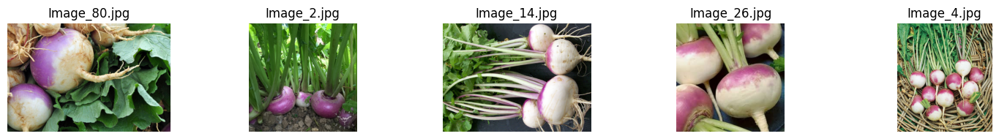

None

**************** CORN ****************



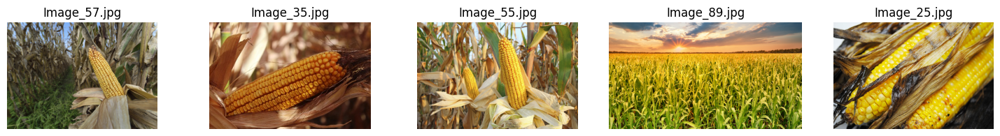

None

**************** SWEETCORN ****************



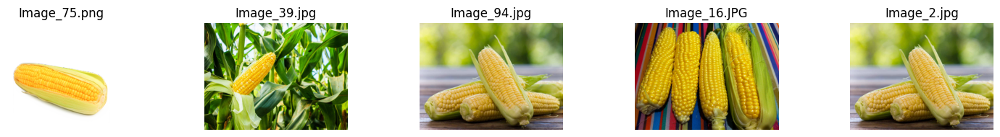

None

**************** SWEETPOTATO ****************



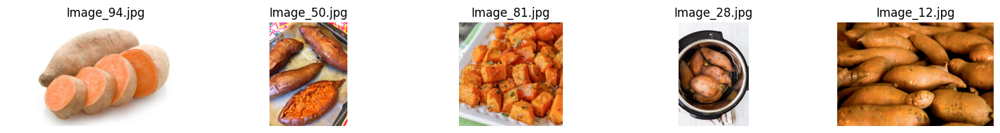

None

**************** PAPRIKA ****************



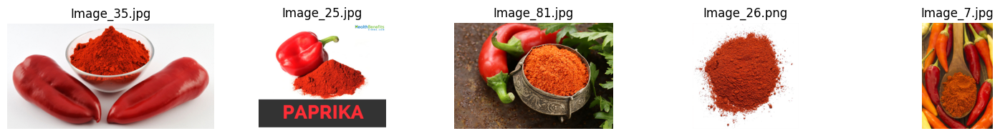

None

**************** JALEPENO ****************



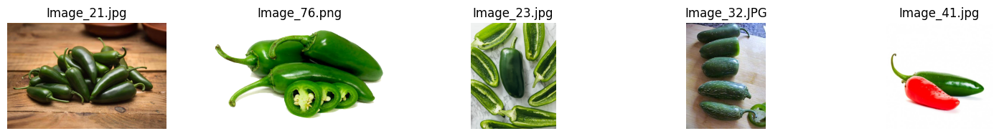

None

**************** GINGER ****************



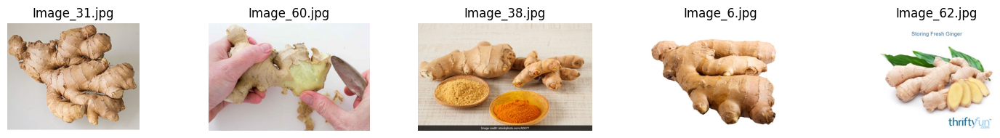

None

**************** GARLIC ****************



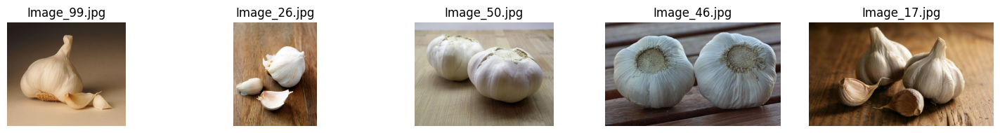

None

**************** PEAS ****************



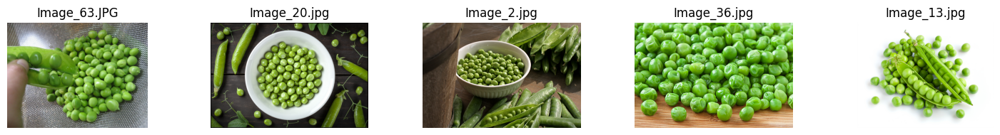

None

**************** EGGPLANT ****************



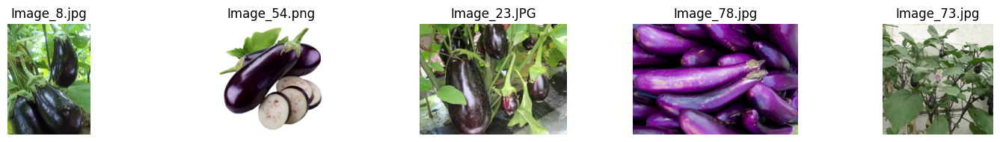

None



In [12]:
for i in veg_list:
  print("****************", i.upper(), "****************")
  print()
  print(process_image("/content/train/" + i, num_images = 5))
  print()

In [13]:
base_dir = '/content'

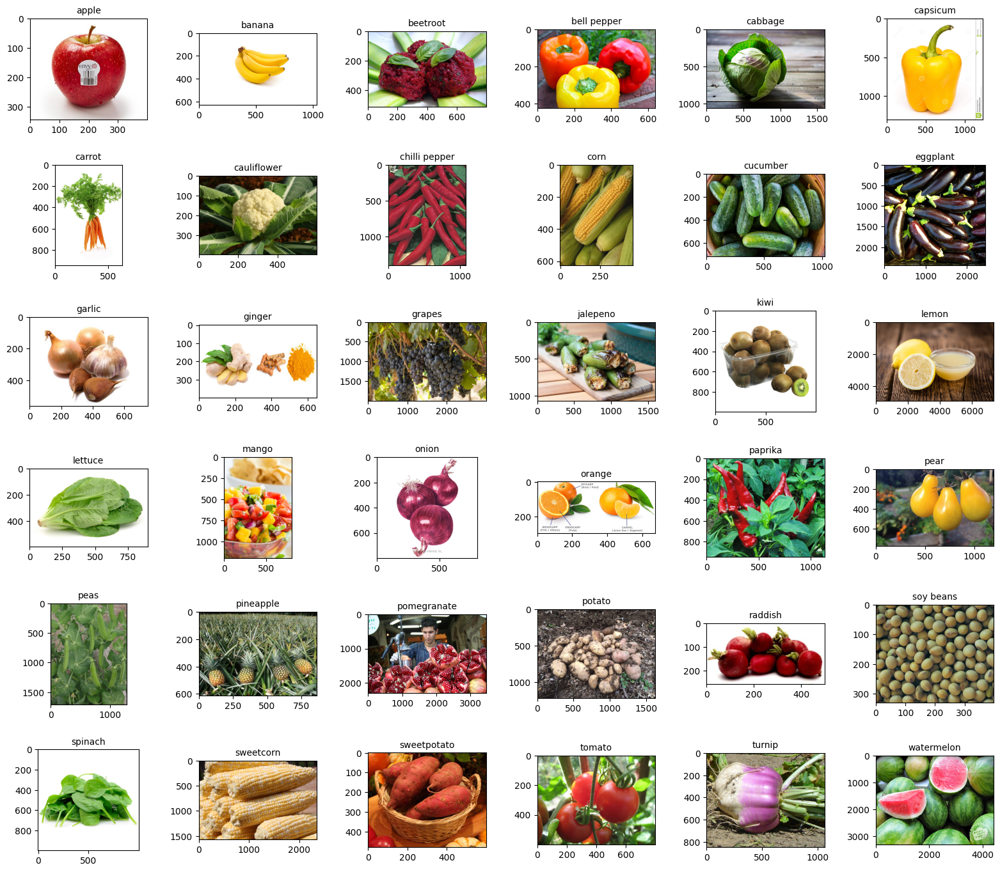

In [14]:
train_path = os.path.join(base_dir, 'train')
test_path = os.path.join(base_dir, 'test')
validation_path = os.path.join(base_dir, 'validation')

categories = sorted(os.listdir(train_path))

# Initialize list for sample images
sample_images = []
for category in categories:
    category_path = os.path.join(train_path, category)
    first_image = os.listdir(category_path)[0]
    sample_images.append(os.path.join(category_path, first_image))

fig, axes = plt.subplots(nrows=6, ncols=6, figsize=(16, 14))

for ax, img_path, label in zip(axes.flat, sample_images, categories):
    ax.imshow(plt.imread(img_path))  # Display the image
    ax.set_title(label, fontsize=10)  # title for each image

plt.tight_layout(pad=2)
plt.show()

## VGG16 Model

In [15]:
base_model = VGG16(include_top = False, weights = 'imagenet', input_shape = (150, 150,3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


## Deep neural network

In [16]:
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation = 'relu'))
#model.add(Dense(64, activation = 'relu'))
model.add(Dense(36, activation = 'softmax'))

In [17]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 4, 4, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 36)                  │           9,252 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,821,348 (64.17 MB)

 Trainable params: 16,821,348 (64.17 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
base_model.trainable = False

In [19]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [20]:
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor = 'val_accuracy', patience = 5, verbose = 1)

In [21]:
history = model.fit(train_df, validation_data = test_df, epochs = 50, callbacks=[es])

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - accuracy: 0.1547 - loss: 3.2749 - val_accuracy: 0.5376 - val_loss: 1.7577
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.4397 - loss: 2.0115 - val_accuracy: 0.5822 - val_loss: 1.3728
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.5366 - loss: 1.6392 - val_accuracy: 0.6546 - val_loss: 1.1238
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 96s 2s/step - accuracy: 0.5761 - loss: 1.4403 - val_accuracy: 0.6852 - val_loss: 1.0344
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.5830 - loss: 1.3875 - val_accuracy: 0.7493 - val_loss: 0.8243
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 96s 2s/step - accuracy: 0.6332 - loss: 1.2134 - val_accuracy: 0.7242 - val_loss: 0.8590
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - accuracy: 0.6678 - loss: 1.1489 - val_accuracy: 0.7772 - val_loss: 0.7506
Epoch 8/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - accuracy: 0.6642 - loss: 1.1255 - val_accuracy: 0.7521 - val_lo

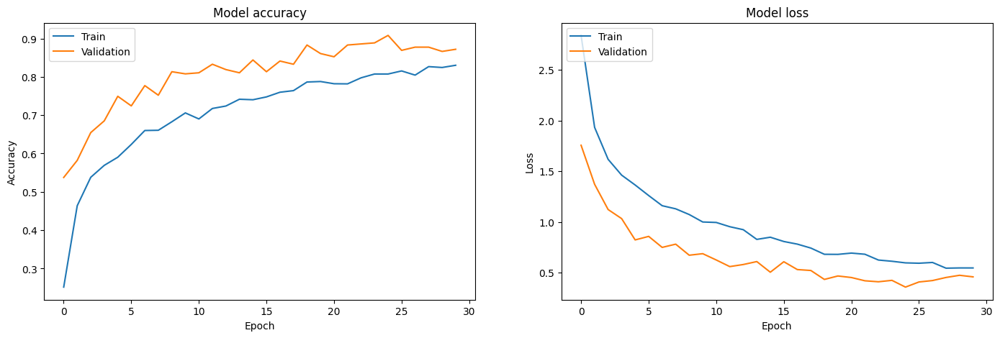

In [22]:
# Plot training & validation accuracy values
plt.figure(figsize=(17, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [23]:
model.evaluate(validation_df)

6/6 ━━━━━━━━━━━━━━━━━━━━ 18s 3s/step - accuracy: 0.8978 - loss: 0.3749


[0.3960011899471283, 0.8831908702850342]

In [24]:
model.evaluate(test_df)

6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.8893 - loss: 0.3503


[0.37087103724479675, 0.8857938647270203]

### Prediction from URL

In [38]:
from PIL import Image
import requests
import io

url = 'https://media.istockphoto.com/id/168278888/photo/fresh-slices-of-mango-on-a-bed-of-leaves.webp?a=1&b=1&s=612x612&w=0&k=20&c=yr6EiJ0XruGksZEmpMaz99BYwE-TU9xXzeWZ-NQAcAY='

response = requests.get(url)
image = Image.open(io.BytesIO(response.content))
image = image.convert('RGB')  # Ensure 3 channels (RGB)
image_resized = image.resize((150, 150))  # Resize to model input size

# Convert image to numpy array and normalize
img_array = np.array(image_resized) / 255.0  # Normalize to [0, 1]
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

# Predict using the trained model
prediction = model.predict(img_array)
predicted_class = categories[np.argmax(prediction)]

print(f"Predicted class: {predicted_class}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Predicted class: mango


### Random Images from Validation dataset and their predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


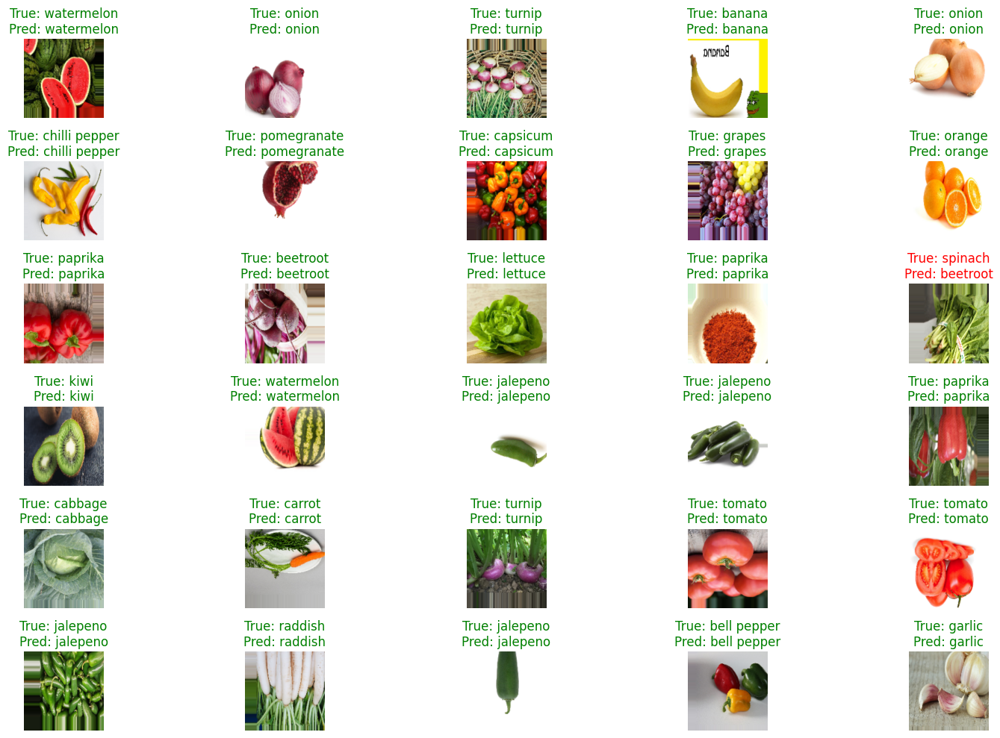

In [40]:
val_images, val_labels = next(validation_df)
indices = random.sample(range(len(val_images)), 30)

predictions = model.predict(val_images[indices])
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(val_labels[indices], axis=1)

plt.figure(figsize=(16, 10))
for i, idx in enumerate(indices):
    plt.subplot(6, 5, i + 1)
    plt.imshow(val_images[idx])
    plt.axis('off')

    true_label = categories[true_labels[i]]
    predicted_label = categories[predicted_labels[i]]
    color = 'green' if true_label == predicted_label else 'red'

    plt.title(f"True: {true_label}\nPred: {predicted_label}", color=color)

plt.tight_layout()
plt.show()